# Geometric Deep Learning
Graph Node Classification using PyTorch Geometric on the Amazon Computers dataset.


## Introduction and requirements

PyTorch Geometric is a geometric deep learning (GDN) extension library for PyTorch. In general GDN is used to generalize deep learning for non-Ecludian data, such as graphs.

In this notebook, we primarily explored the Amazon products network for the further classification task. 

In [2]:
!pip install torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric -f https://data.pyg.org/whl/torch-1.11.0+cu113.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://data.pyg.org/whl/torch-1.11.0+cu113.html
     |████████████████████████████████| 7.9 MB 11.8 MB/s 
     |████████████████████████████████| 3.5 MB 100.4 MB/s 
     |████████████████████████████████| 2.5 MB 67.7 MB/s 
     |████████████████████████████████| 750 kB 72.6 MB/s 
     |████████████████████████████████| 407 kB 12.8 MB/s 
  Created wheel for torch-geometric: filename=torch_geometric-2.0.4-py3-none-any.whl size=616603 sha256=8b10626e40c19005716fc963db67d0561af2c40c788a60d665a2593dcce768d1
  Stored in directory: /root/.cache/pip/wheels/18/a6/a4/ca18c3051fcead866fe7b85700ee2240d883562a1bc70ce421
Successfully built torch-geometric


In [3]:
!pip install powerlaw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


First of all, import the necessary libraries

In [4]:
import torch
import torch_geometric
import torch.nn.functional as F
import torch_geometric.transforms as T
from torch_geometric.utils import subgraph
from torch_geometric.datasets import AmazonProducts

import powerlaw
import scipy.sparse

import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt

from sklearn.manifold import TSNE
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import balanced_accuracy_score

In [5]:
clr_palette = sns.color_palette('colorblind', 10)
clr_palette = np.array(clr_palette)[[3, 2, 7, 9, 0, 4]]

In [6]:
from google.colab import drive
drive.mount('/content/drive')
DATA_PATH = '/content/drive/MyDrive/NetworkML/data/'

Mounted at /content/drive


## Load the dataset

We load the Amazon Computers dataset which is comprised of networks, where nodes represent goods and edges represent that two goods are frequently bought together. 



In [7]:
# dataset = 'Computers'
root='./dataset'
dataset = AmazonProducts(root, transform=T.TargetIndegree())

Processing...
Done!


In [8]:
data = dataset[0]
print(data)

Data(x=[1569960, 200], edge_index=[2, 264339468], y=[1569960, 107], train_mask=[1569960], val_mask=[1569960], test_mask=[1569960], edge_attr=[264339468, 1])


## Dataset Exploration

### Labels Distribution

First, let's have a look at the distribution of the class. Since we will do classification in the following part, we would like to know if the labels are balanced. 

Please note that one product could belong to several classes.

In [ ]:
occurences = np.nonzero(data.y)[:,1]

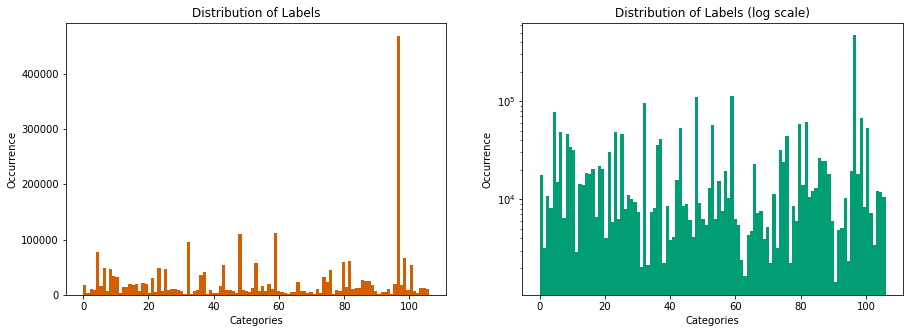

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15,5))
axs[0].hist(occurences, bins = len(np.unique(occurences)), color=clr_palette[0])
axs[0].set_ylabel('Occurrence')
axs[0].set_xlabel('Categories')
axs[0].set_title('Distribution of Labels')

axs[1].hist(occurences, bins = len(np.unique(occurences)), color=clr_palette[1])
axs[1].set_ylabel('Occurrence')
axs[1].set_xlabel('Categories')
axs[1].set_yscale('log')
axs[1].set_title('Distribution of Labels (log scale)')

plt.show()

In [ ]:
from collections import Counter

most_common = Counter(np.array(occurences)).most_common(10)
sum_most_common = np.sum([tup[1] for tup in most_common])

print(f'The most frequent 10 classes take up {sum_most_common/len(occurences) * 100:.2f}% of the dataset')

The most frequent 10 classes take up 46.81% of the dataset


As we can see, the distribution of the labels are unbalanced: the occurrences of most dominant 10 classes already take up 46.81% of the whole dataset, which contains 107 classes of products. 

### Degree Distribution

In [ ]:
data = dataset[0]

selected_classes = np.arange(30)
selected_nodes = (data.y[:, selected_classes]).sum(axis=1) > 0
edge_index, edge_attr = subgraph(selected_nodes, edge_index=data.edge_index, edge_attr=data.edge_attr, relabel_nodes=True)
data = torch_geometric.data.Data(edge_index=edge_index, edge_attr=edge_attr)

G = torch_geometric.utils.to_networkx(data, to_undirected=True)
G.remove_edges_from(nx.selfloop_edges(G))

/usr/local/lib/python3.7/dist-packages/torch_geometric/data/storage.py:266: UserWarning: Unable to accurately infer 'num_nodes' from the attribute set '{'edge_index', 'edge_attr'}'. Please explicitly set 'num_nodes' as an attribute of 'data' to suppress this warning
  " to suppress this warning")


In [ ]:
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
dmax = max(degree_sequence)
dmean = np.mean(degree_sequence)

In [ ]:
print(f'The maximum degree in the the subgraph of first 30 classes is {dmax}, The mean degree in the the subgraph of first 10 classes is {dmean:2f}')

The maximum degree in the the subgraph of first 30 classes is 22967, The mean degree in the the subgraph of first 10 classes is 51.211363


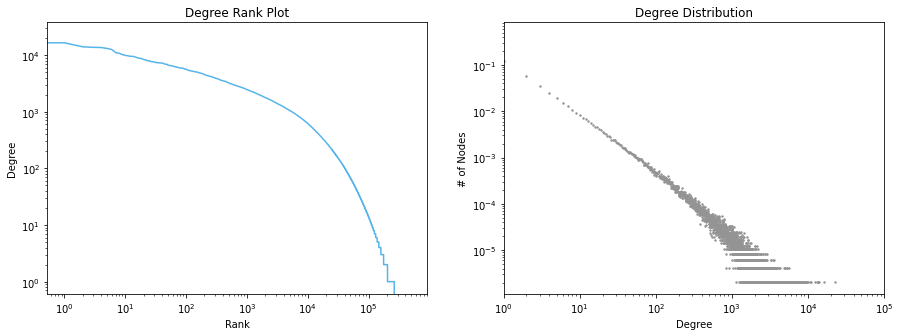

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15,5))

axs[0].plot(degree_sequence, "b-", color=clr_palette[3])
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylabel("Degree")
axs[0].set_xlabel('Rank')
axs[0].set_title('Degree Rank Plot')

axs[1].scatter(x = np.unique(degree_sequence, return_counts=True)[0], y = np.unique(degree_sequence, return_counts=True)[1] / len(degree_sequence), s = 2, color=clr_palette[2])
axs[1].set_ylabel('# of Nodes')
axs[1].set_xlabel('Degree')
axs[1].set_xlim(1,1e5)
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_title('Degree Distribution')

plt.show()

Values less than or equal to 0 in data. Throwing out 0 or negative values


alpha=  1.2988349942187982   sigma=  0.0005842161698696816


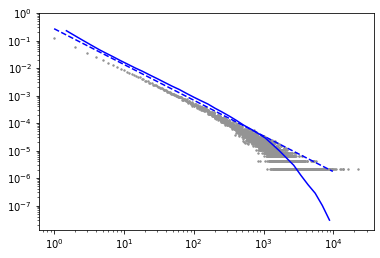

In [ ]:
fit = powerlaw.Fit(degree_sequence, xmin = 1e0, xmax = 1e4, discrete=True)
fit.power_law.plot_pdf(color= 'b',linestyle='--',label='fit ccdf');
fit.plot_pdf(color= 'b');
plt.scatter(x = np.unique(degree_sequence, return_counts=True)[0], y = np.unique(degree_sequence, return_counts=True)[1] / len(degree_sequence), s = 2, color=clr_palette[2])

print('alpha= ',fit.power_law.alpha,'  sigma= ',fit.power_law.sigma)

### Clustering Coefficient & Centrality Coefficient

In [9]:
data = dataset[0]

selected_classes = np.arange(5)
selected_nodes = (data.y[:, selected_classes]).sum(axis=1) > 0
edge_index, edge_attr = subgraph(selected_nodes, edge_index=data.edge_index, edge_attr=data.edge_attr, relabel_nodes=True)
data = torch_geometric.data.Data(edge_index=edge_index, edge_attr=edge_attr)

G = torch_geometric.utils.to_networkx(data, to_undirected=True)
G.remove_edges_from(nx.selfloop_edges(G))

/usr/local/lib/python3.7/dist-packages/torch_geometric/data/storage.py:266: UserWarning: Unable to accurately infer 'num_nodes' from the attribute set '{'edge_index', 'edge_attr'}'. Please explicitly set 'num_nodes' as an attribute of 'data' to suppress this warning
  " to suppress this warning")


In [10]:
degree_array = np.array([d for n, d in G.degree()])

In [11]:
clustering_coefficient = nx.clustering(G)
clustering_coefficient = np.array([clustering_coefficient[node] for node in G.nodes()])

In [18]:
closeness_centrality = nx.closeness_centrality(G)
closeness_centrality = np.array([closeness_centrality[node] for node in G.nodes()])

In [12]:
eigen_centrality = nx.eigenvector_centrality_numpy(G)
eigen_centrality = np.array([eigen_centrality[node] for node in G.nodes()])

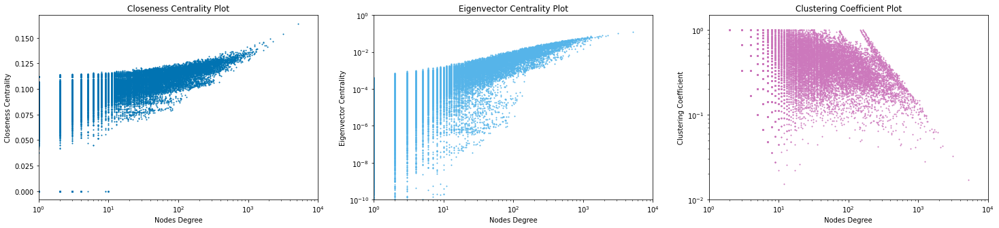

In [19]:
fig, axs = plt.subplots(1, 3, figsize=(25,5))

axs[0].scatter(x = degree_array, y = closeness_centrality, s = 1, color=clr_palette[4])
axs[0].set_ylabel("Closeness Centrality")
axs[0].set_xlabel('Nodes Degree')
axs[0].set_xscale('log')
axs[0].set_xlim(1,1e4)
axs[0].set_title('Closeness Centrality Plot')

axs[1].scatter(x = degree_array, y = eigen_centrality, s = 1, color=clr_palette[3])
axs[1].set_ylabel('Eigenvector Centrality')
axs[1].set_xlabel('Nodes Degree')
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlim(1,1e4)
axs[1].set_ylim(1e-10,1e0)
axs[1].set_title('Eigenvector Centrality Plot')

axs[2].scatter(x = degree_array, y = clustering_coefficient, s = 1, color=clr_palette[5])
axs[2].set_ylabel('Clustering Coefficient')
axs[2].set_xlabel('Nodes Degree')
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_xlim(1,1e4)
axs[2].set_ylim(1e-2,1.5)
axs[2].set_title('Clustering Coefficient Plot')

plt.show()

In [20]:
print("Mean eigen centrality", np.mean(eigen_centrality))

Mean eigen centrality 0.0005414023136031273


In [21]:
print("Mean clustering coefficient", np.mean(clustering_coefficient))

Mean clustering coefficient 0.11891396229224718


In [22]:
print("Mean closeness coefficient", np.mean(closeness_centrality))

Mean closeness coefficient 0.03388516628204633


### Density

In [23]:
print("Network density:", nx.density(G))

Network density: 0.00010646657735390082


## Clustering

### Spectral Clustering

We first experimented with spectral clustering,

In [ ]:
data = dataset[0]

selected_classes = np.arange(2,4)
selected_nodes = (data.y[:, selected_classes]).sum(axis=1) > 0
edge_index, edge_attr = subgraph(selected_nodes, edge_index=data.edge_index, edge_attr=data.edge_attr, relabel_nodes=True)
data = torch_geometric.data.Data(edge_index=edge_index, edge_attr=edge_attr, x=data.x[selected_nodes], y= data.y[selected_nodes])

G = torch_geometric.utils.to_networkx(data, to_undirected=True)

In [ ]:
sc = SpectralClustering(2, affinity='precomputed', n_init=100)
adj_mat = nx.to_numpy_matrix(G)
sc.fit(adj_mat)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


SpectralClustering(affinity='precomputed', n_clusters=2, n_init=100)

In [ ]:
balanced_accuracy_score(np.array(data.y).argmax(-1), sc.labels_+2)

0.5006773373295842

From the result, the balanced accuracy score is close to 0.5, which indicates the performance of spectral clustering here is similar to random prediction. The reason might be that there's no individual single-class cluster: customers tend to purchase products of different categories. Therefore, in each cluster, the various classes are highly entangled, it is almost impossible to do classification based on cluster structure.

### T-SNE

In [ ]:
data = dataset[0]

selected_classes = np.arange(5)
selected_nodes = (data.y[:, selected_classes]).sum(axis=1) > 0
edge_index, edge_attr = subgraph(selected_nodes, edge_index=data.edge_index, edge_attr=data.edge_attr, relabel_nodes=True)
data = torch_geometric.data.Data(edge_index=edge_index, edge_attr=edge_attr, x=data.x[selected_nodes], y= data.y[selected_nodes])

G = torch_geometric.utils.to_networkx(data, to_undirected=True)

In [ ]:
x=data.x
X_embedded = TSNE(n_components=2, learning_rate='auto',
                  init='random').fit_transform(x)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


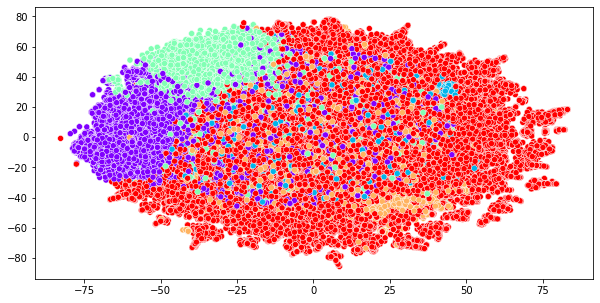

In [ ]:
plt.figure(figsize = (10, 5))
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], c = data.y.argmax(-1), cmap='rainbow', marker='o')
plt.show()

In [ ]:
X_embedded = TSNE(n_components=3, learning_rate='auto',
                  init='random').fit_transform(x)

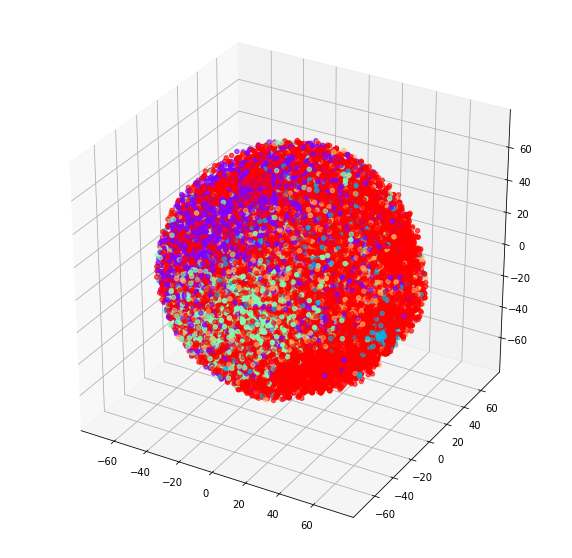

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(projection='3d')
ax.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], c = data.y.argmax(-1), cmap='rainbow', marker='o')
plt.show()

In [ ]:
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_embedded, data.y.argmax(-1))

print(neigh.score(X_embedded, data.y.argmax(-1)))
print(balanced_accuracy_score(data.y.argmax(-1), neigh.predict(X_embedded)))
print(confusion_matrix(data.y.argmax(-1), neigh.predict(X_embedded)))
print(f1_score(data.y.argmax(-1), neigh.predict(X_embedded), average='weighted'))

0.8419292217675419
0.6564700808958965
[[13921    31   424    82  3141]
 [  459  1347     5    44  1321]
 [  935   185  8533    38  1023]
 [  965   505   317  2696  3669]
 [ 2225   820   438   717 65882]]
0.8322099341823639


In [ ]:
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(data.x, data.y.argmax(-1))

print(neigh.score(data.x, data.y.argmax(-1)))
print(balanced_accuracy_score(data.y.argmax(-1), neigh.predict(data.x)))
print(confusion_matrix(data.y.argmax(-1), neigh.predict(data.x)))
print(f1_score(data.y.argmax(-1), neigh.predict(data.x), average='weighted'))

0.8350482578857669
0.6458919116461607
[[12749    31   208   126  4485]
 [  181  1530     2    52  1411]
 [  781   352  7668    61  1852]
 [  431   713   216  2891  3901]
 [ 1000  1139   267   890 66786]]
0.8259157983522278


From the result of t-SNE, we could tell that node features already give meaningful information on the class of the product, using K nearest neighborhood, we could reach a f1 score of around 83%.

## Visualization of the subgraph

In [ ]:
data = dataset[0]

selected_classes = np.arange(10)
selected_nodes = (data.y[:, selected_classes]).sum(axis=1) > 0
edge_index, edge_attr = subgraph(selected_nodes, edge_index=data.edge_index, edge_attr=data.edge_attr, relabel_nodes=True)
data = torch_geometric.data.Data(edge_index=edge_index, edge_attr=edge_attr, x=data.x[selected_nodes], y= data.y[selected_nodes])

G = torch_geometric.utils.to_networkx(data, to_undirected=True)
G.remove_edges_from(nx.selfloop_edges(G))

attri = {}
y_class = data.y.argmax(-1)
for i in G.nodes:
  attri[i] =y_class[i].item()
nx.set_node_attributes(G, attri, "labels")

In [ ]:
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
Gcc = nx.Graph(Gcc)

node_color = [Gcc.nodes[u]['labels'] for u in Gcc.nodes()]
node_size = [Gcc.degree(v) for v in Gcc]

pos = nx.kamada_kawai_layout(Gcc)

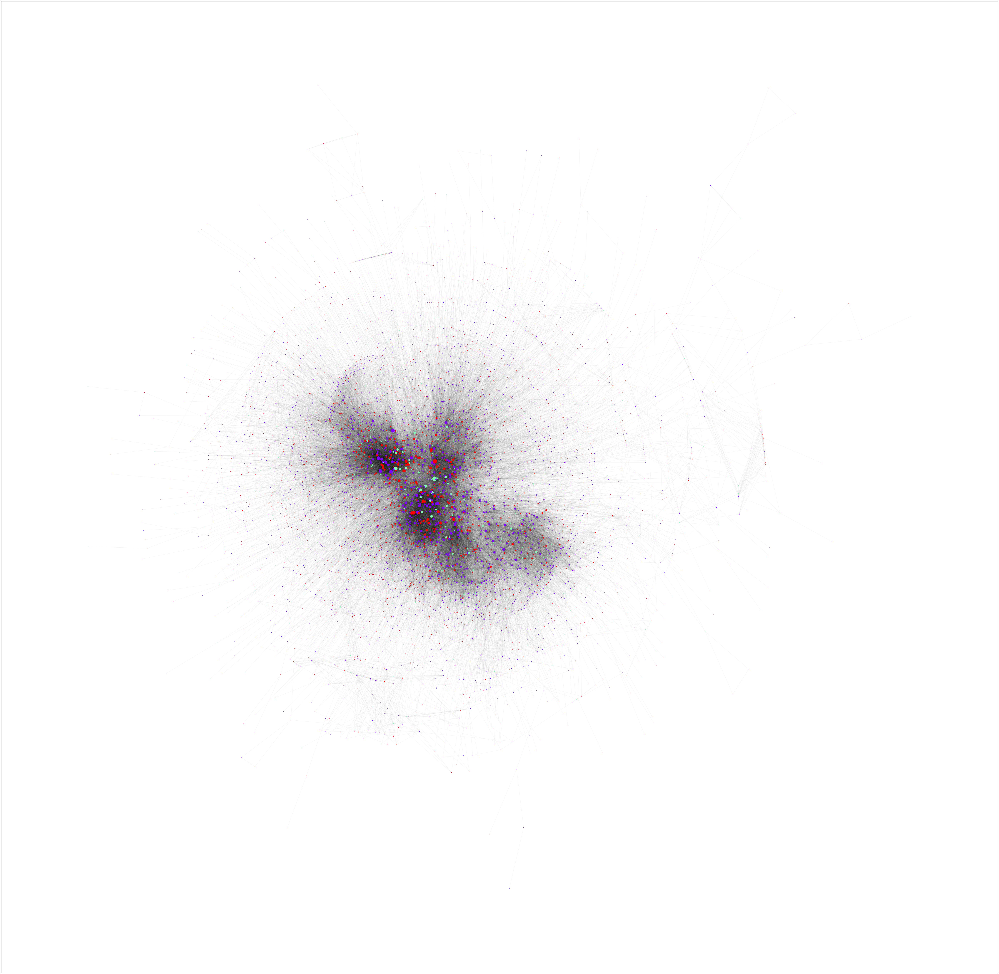

In [ ]:
plt.figure(figsize = (100,100))
sm = nx.draw_networkx_nodes(Gcc, pos, node_size=node_size, node_color = node_color, cmap = 'rainbow')
sm = nx.draw_networkx_edges(Gcc, pos, alpha=0.05)

In [ ]:
data = dataset[0]

selected_classes = np.arange(15)
selected_nodes = (data.y[:, selected_classes]).sum(axis=1) > 0
edge_index, edge_attr = subgraph(selected_nodes, edge_index=data.edge_index, edge_attr=data.edge_attr, relabel_nodes=True)
data = torch_geometric.data.Data(edge_index=edge_index, edge_attr=edge_attr, x=data.x[selected_nodes], y= data.y[selected_nodes])

G = torch_geometric.utils.to_networkx(data, to_undirected=True)
G.remove_edges_from(nx.selfloop_edges(G))

attri = {}
y_class = data.y.argmax(-1)
for i in G.nodes:
  attri[i] =y_class[i].item()
nx.set_node_attributes(G, attri, "labels")

In [ ]:
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
Gcc = nx.Graph(Gcc)

node_color = [Gcc.nodes[u]['labels'] for u in Gcc.nodes()]
node_size = [Gcc.degree(v) for v in Gcc]

pos = nx.spring_layout(Gcc)

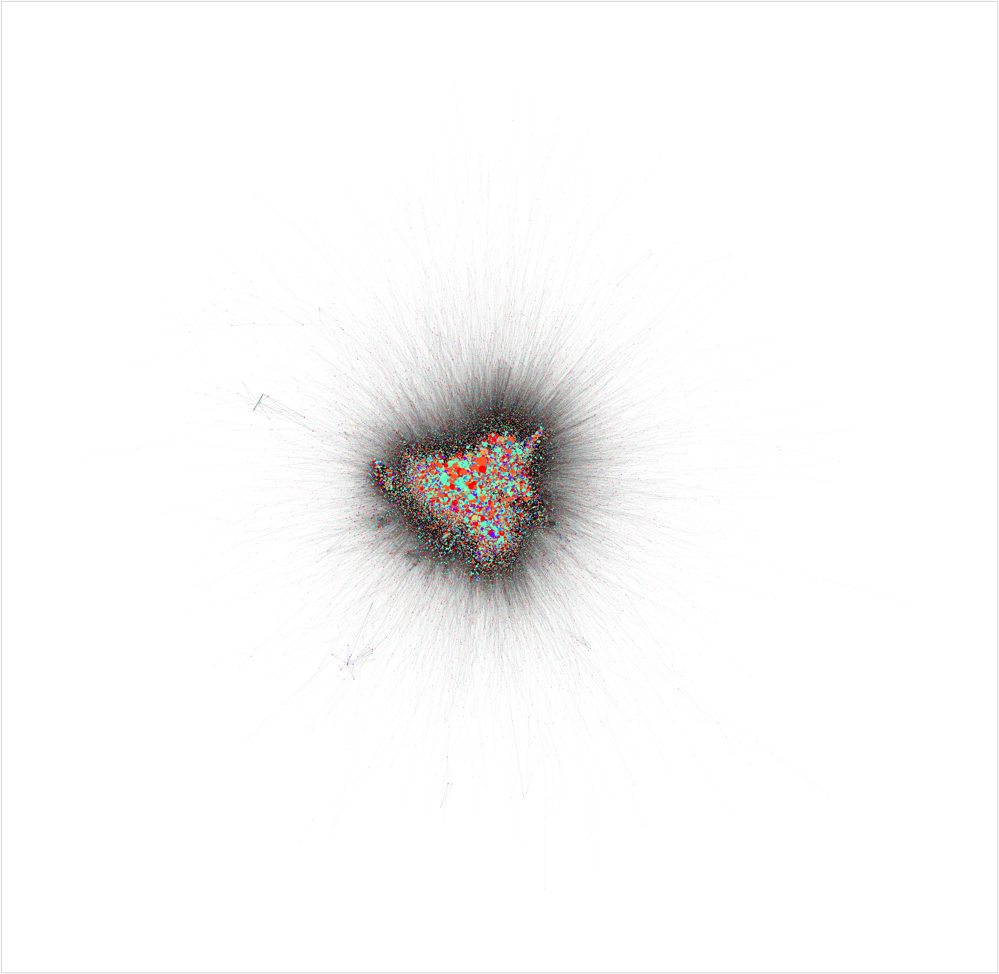

In [ ]:
plt.figure(figsize = (100,100))
sm = nx.draw_networkx_nodes(Gcc, pos, node_size=node_size, node_color = node_color, cmap = 'rainbow')
sm = nx.draw_networkx_edges(Gcc, pos, alpha=0.05)